# Identify Unique Accounts

In [25]:
import pandas as pd
import matplotlib.pylab as plt
%matplotlib inline
pd.set_option('max_columns', 100)

In [2]:
train = pd.read_parquet('../../input/train.parquet')
test = pd.read_parquet('../../input/test.parquet')

In [5]:
tt = pd.concat([train, test], sort=False)

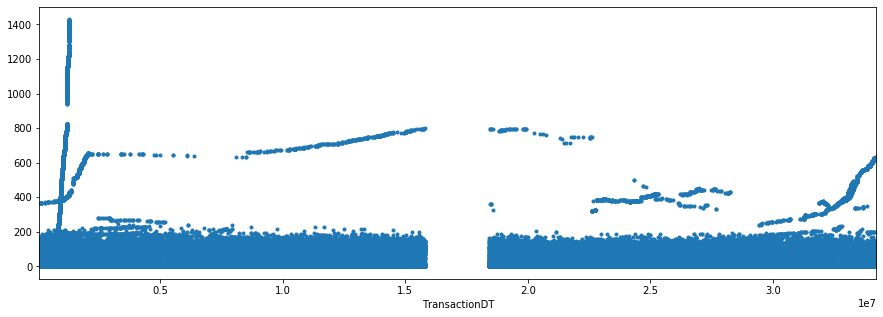

In [15]:
tt.set_index('TransactionDT')['C14'].plot(figsize=(15, 5), style='.')

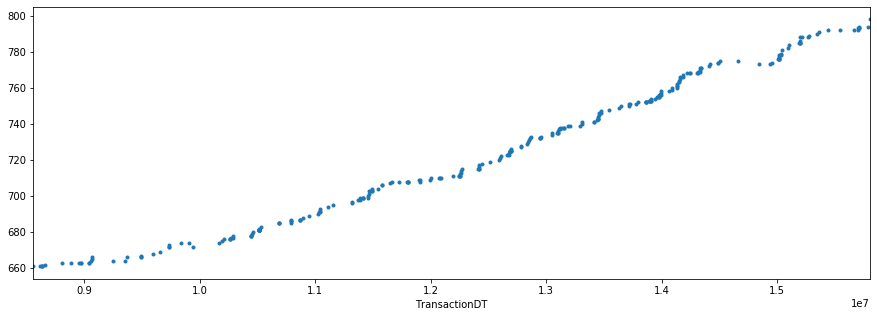

In [29]:
tt.loc[(tt['C14'] >= 650) & 
       (tt['TransactionDT'] > 5000000) & 
       (tt['TransactionDT'] < 18000000)] \
    .set_index('TransactionDT')['C14'].plot(figsize=(15, 5), style='.')

# Mark This guy

In [34]:
tt['the_guy'] = False
tt.loc[(tt['C14'] >= 650) & 
       (tt['TransactionDT'] > 5000000) & 
       (tt['TransactionDT'] < 18000000), 'the_guy'] = True

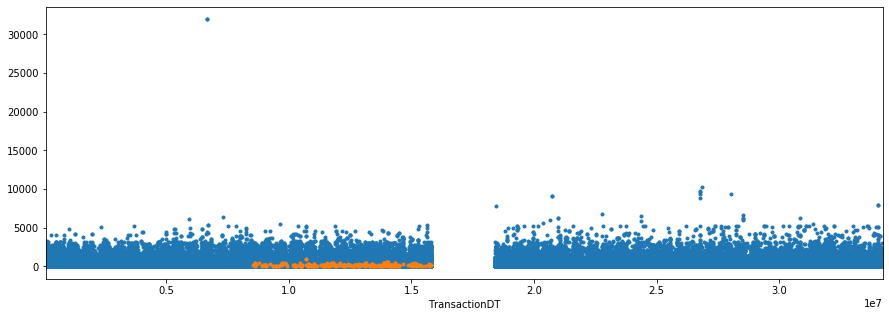

In [39]:
for i, d in tt.groupby('the_guy'):
    d.set_index('TransactionDT')['TransactionAmt'].plot(figsize=(15, 5), style='.')

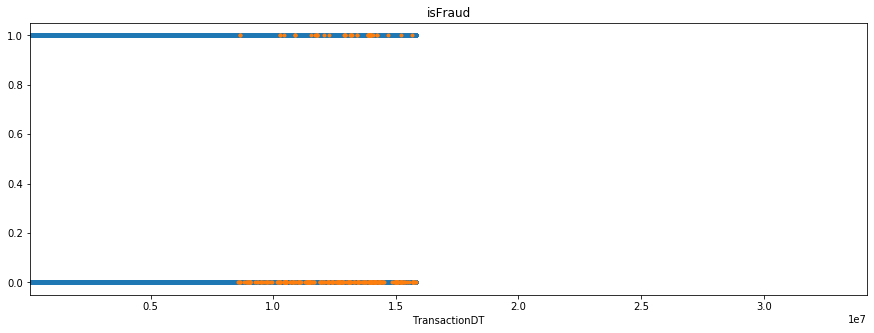

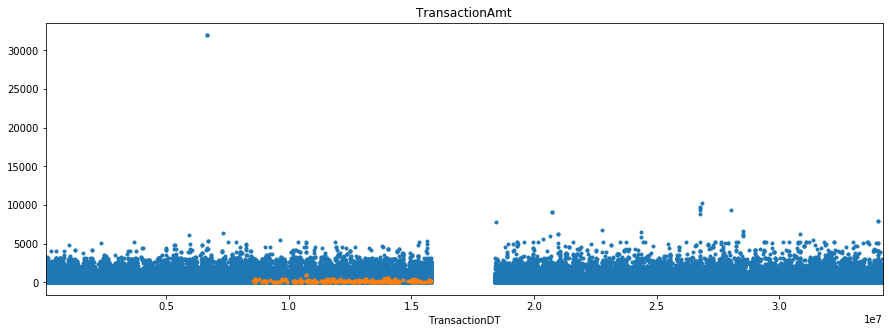

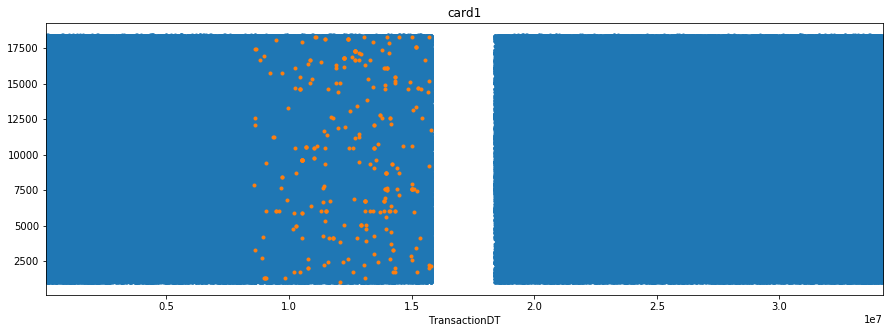

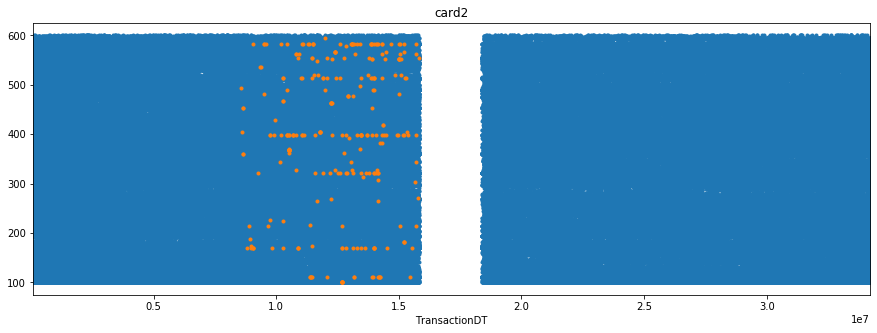

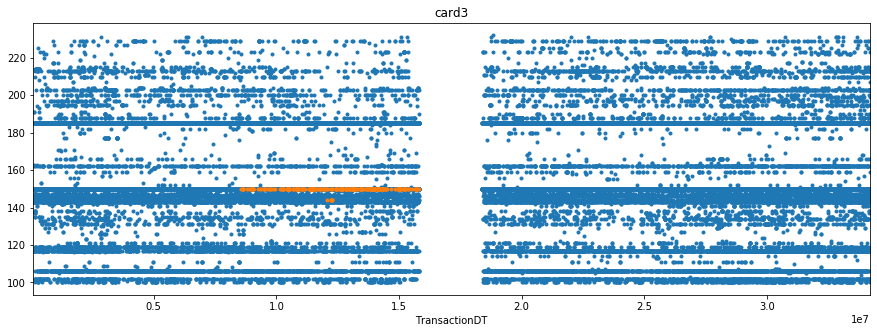

...

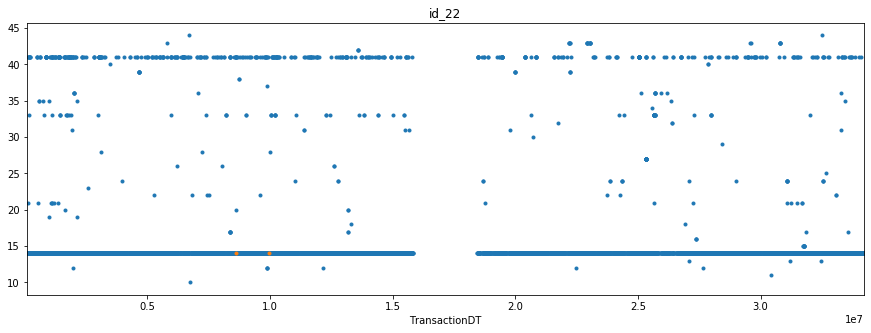

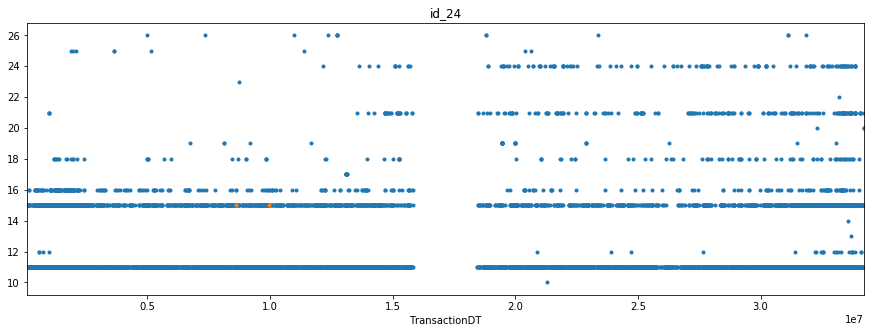

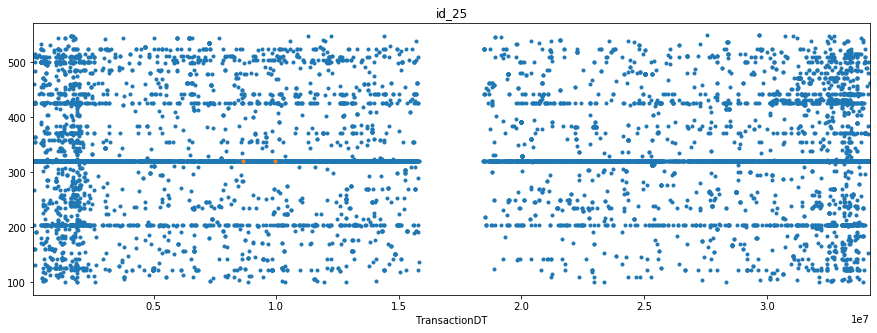

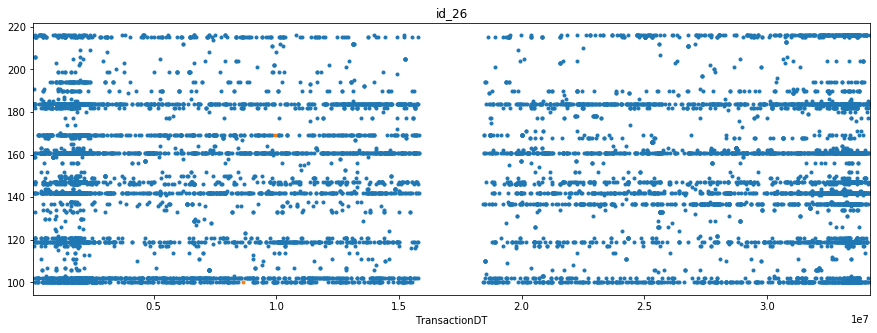

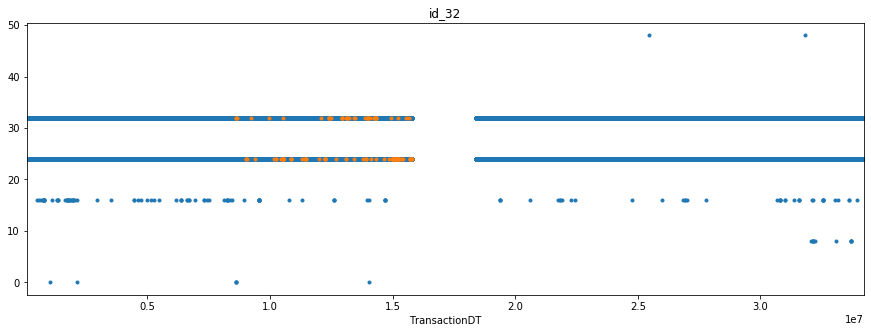

In [43]:
for c in tt.columns:
    try:
        for i, d in tt.groupby('the_guy'):
            d.set_index('TransactionDT')[c].plot(figsize=(15, 5), style='.', title=c)
    except:
        pass
    plt.show()

In [40]:
# tt.loc[(tt['C14'] <= 400) & (tt['TransactionDT'] > 5000000)].set_index('TransactionDT')['C14'].plot(figsize=(15, 5), style='.')

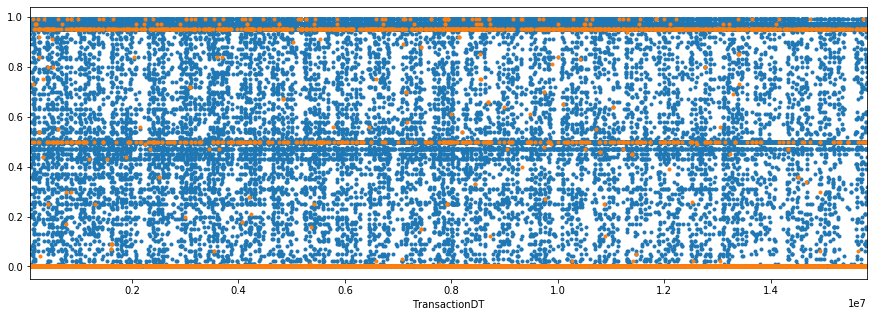

In [55]:
tt['TransactionAmt_Dec'] = tt['TransactionAmt'] % 1
for i, d in tt.query("ProductCD == 'W'").groupby('isFraud'):
    d.set_index('TransactionDT')['TransactionAmt_Dec'].plot(figsize=(15, 5), style='.')